In [1]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import time
from datetime import timedelta
from IPython import display

plt.style.use('dark_background')

In [2]:
EPOCHS = 22
START_EPOCH_FROM = 20
BATCH_SIZE = 10
SEED_FILE_NAME = 'seed.npy'
noise_dim = 100
num_examples_to_generate = 25

if os.path.exists('seed.npy'):
  with open(SEED_FILE_NAME, 'rb') as seed_file:
    seed = np.load(seed_file)
else:
  with open(SEED_FILE_NAME, 'wb') as seed_file:
    seed = tf.random.normal([num_examples_to_generate, noise_dim])
    np.save(seed_file, seed)

In [3]:
img_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1/255)

img_generator = img_datagen.flow_from_directory(
  directory='data',
  target_size=(100, 100),
  batch_size=10)

Found 49887 images belonging to 1 classes.


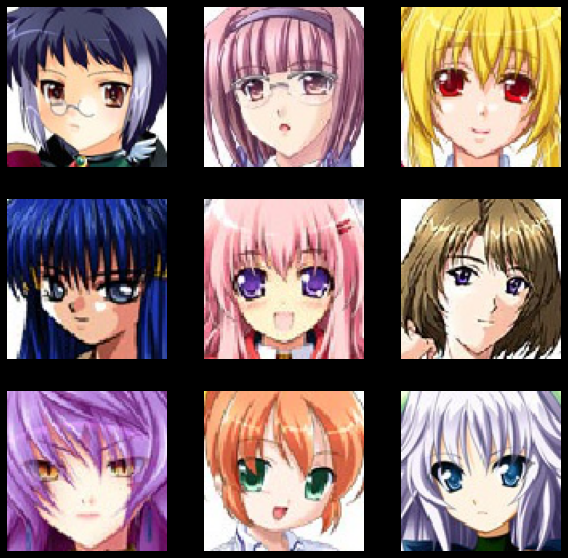

In [4]:
plt.figure(figsize=(10, 10))
images, label = img_generator.next()

for i in range(9):
  plt.subplot(3, 3, i + 1)
    
  plt.imshow(images[i, :, :, :])
  plt.axis('off')

plt.show()

In [5]:
class GAN():
  def __init__(self, noise_dim, input_shape):
    super().__init__()
    self.noise_dim = noise_dim
    self.input_shape = input_shape

    self.generator = tf.keras.Sequential(
      [
        tf.keras.layers.Dense(11*11*256, use_bias=False, input_shape=(self.noise_dim,)),
        tf.keras.layers.Reshape((11, 11, 256)),
        tf.keras.layers.Conv2DTranspose(256, (5, 5), (2, 2), activation=tf.nn.leaky_relu),
        tf.keras.layers.Conv2DTranspose(256, (5, 5), (2, 2), activation=tf.nn.leaky_relu, padding='same'),
        tf.keras.layers.Conv2DTranspose(256, (5, 5), (2, 2), activation=tf.nn.leaky_relu, padding='same'),
        tf.keras.layers.Conv2DTranspose(3, (5, 5), activation=tf.nn.leaky_relu, padding='same'),
      ], name='Generator'
    )

    self.discriminator = tf.keras.Sequential(
      [
        tf.keras.layers.Conv2D(256, (5, 5), input_shape=input_shape, activation=tf.nn.relu),
        tf.keras.layers.MaxPool2D((2, 2)),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Conv2D(256, (5, 5), activation=tf.nn.leaky_relu),
        tf.keras.layers.MaxPool2D((2, 2)),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Conv2D(256, (5, 5), activation=tf.nn.leaky_relu),
        tf.keras.layers.MaxPool2D((2, 2)),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(1),
      ], name='Discriminator'
    )

  def save(self, fname=None):
    if fname:
      self.discriminator.save_weights(f'{fname}-discriminator-weights.h5')
      self.generator.save_weights(f'{fname}-generator-weights.h5')
    else:
      self.discriminator.save_weights('anime-faces-discriminator-weights.h5')
      self.generator.save_weights('anime-faces-generator-weights.h5')
  
  def load(self, fname=None):
    if fname:
      self.discriminator.load_weights(f'{fname}-discriminator-weights.h5')
      self.generator.load_weights(f'{fname}-generator-weights.h5')
    else:
      self.discriminator.load_weights('anime-faces-discriminator-weights.h5')
      self.generator.load_weights('anime-faces-generator-weights.h5')

In [6]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

def discriminator_loss(real_output, fake_output):
  real_loss = cross_entropy(tf.ones_like(real_output), real_output)
  fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
  total_loss = real_loss + fake_loss
  return total_loss

def generator_loss(fake_output):
  return cross_entropy(tf.ones_like(fake_output), fake_output)

In [7]:
@tf.function
def train_step(model, images):
  noise = tf.random.normal([BATCH_SIZE, noise_dim])

  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    generated_images = model.generator(noise, training=True)

    real_output = model.discriminator(images, training=True)
    fake_output = model.discriminator(generated_images, training=True)

    gen_loss = generator_loss(fake_output)
    disc_loss = discriminator_loss(real_output, fake_output)

  gradients_of_generator = gen_tape.gradient(gen_loss, model.generator.trainable_variables)
  gradients_of_discriminator = disc_tape.gradient(disc_loss, model.discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(gradients_of_generator, model.generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, model.discriminator.trainable_variables))

  return gen_loss, disc_loss

In [8]:
def generate_and_save_images(model, epoch, test_input, save_img=False, folder='images', grid_side=5):
  if not os.path.exists(folder): os.mkdir(folder)
  predictions = model(test_input, training=False)
  

  fig = plt.figure(figsize=(15, 15))

  for i in range(predictions.shape[0]):
    plt.subplot(grid_side, grid_side, i+1)
    plt.imshow(np.clip(predictions[i, :, :, :], 0, 1))
    plt.axis('off')

  if save_img: plt.savefig(f'{folder}/{folder}_{epoch:04d}.png')
  plt.show()

In [9]:
def train(dataset, epochs, start_from=0):
  generate_and_save_images(model.generator, start_from, seed)
    
  start_training = time.perf_counter()

  for epoch in range(start_from + 1, epochs + 1):
    gen_loss = tf.keras.metrics.Mean()
    disc_loss = tf.keras.metrics.Mean()

    avg_gl = 0
    avg_dl = 0

    for i in range(1, 4989):
      image_batch, _ = dataset.next()
      gl, dl = train_step(model, image_batch)

      avg_gl = 0.9 * avg_gl + 0.1 * gl   
      avg_dl = 0.9 * avg_dl + 0.1 * dl   

      # Display the generated images every 100th batch of a single epoch
      if i % 100 == 0:
        display.clear_output(wait=True)
        generate_and_save_images(model.generator, 0, seed)
      
      # Print avg losses every 10 batches
      if i % 10 == 0: 
        print(f'\repoch: {epoch}/{epochs}\tbatch: {i:>4}/4988\tgl: {avg_gl:.4f}' + \
              f'\tdl: {avg_dl: .4f}', end='')
      
    display.clear_output(wait=True)
    generate_and_save_images(model.generator, epoch, seed, epoch % 1 == 0)
    print(f'gl: {avg_gl:.4f}\tdl: {avg_dl: .4f}', end='')


  training_time = time.perf_counter() - start_training

  return training_time

In [10]:
model = GAN(noise_dim, (100, 100, 3))

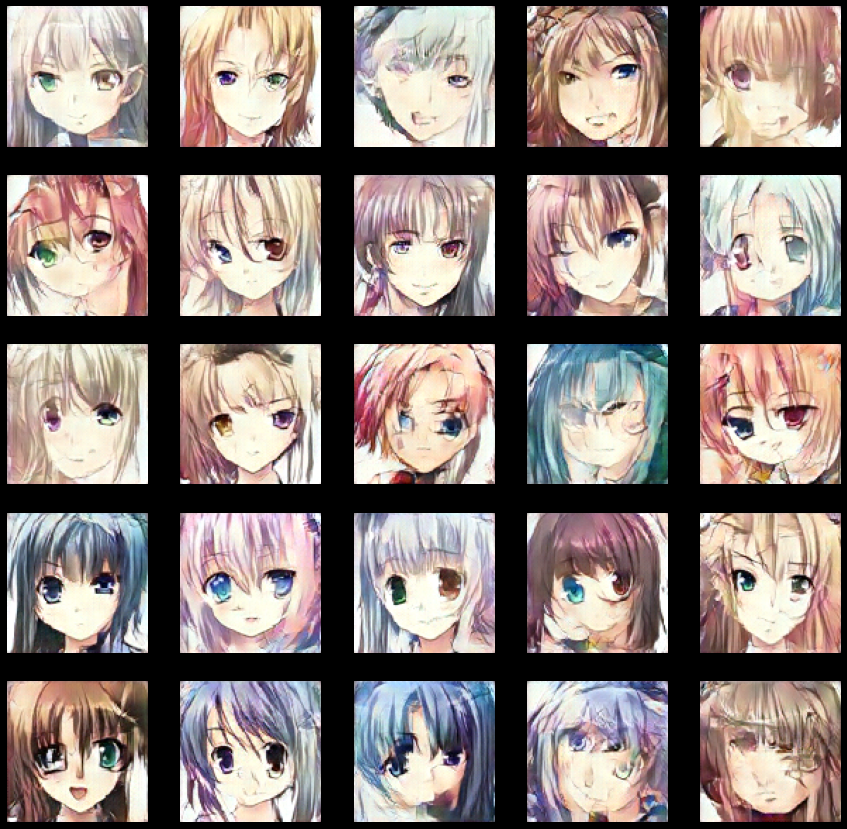

In [11]:
if START_EPOCH_FROM > 0: model.load()

trōaining_time = train(img_generator, EPOCHS, START_EPOCH_FROM)

In [12]:
model.save()

In [13]:
p = model.generator(seed, training=False)
np.max(p), np.min(p)

(1.3608017, -0.023421837)

In [14]:
!python images_to_gif.py images anime-faces

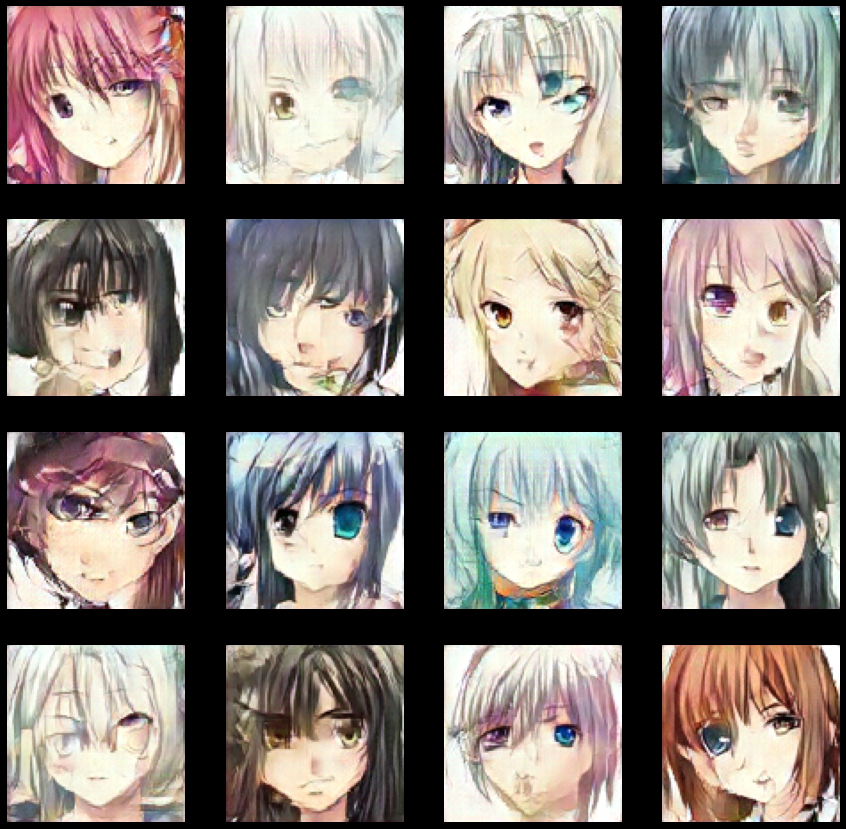

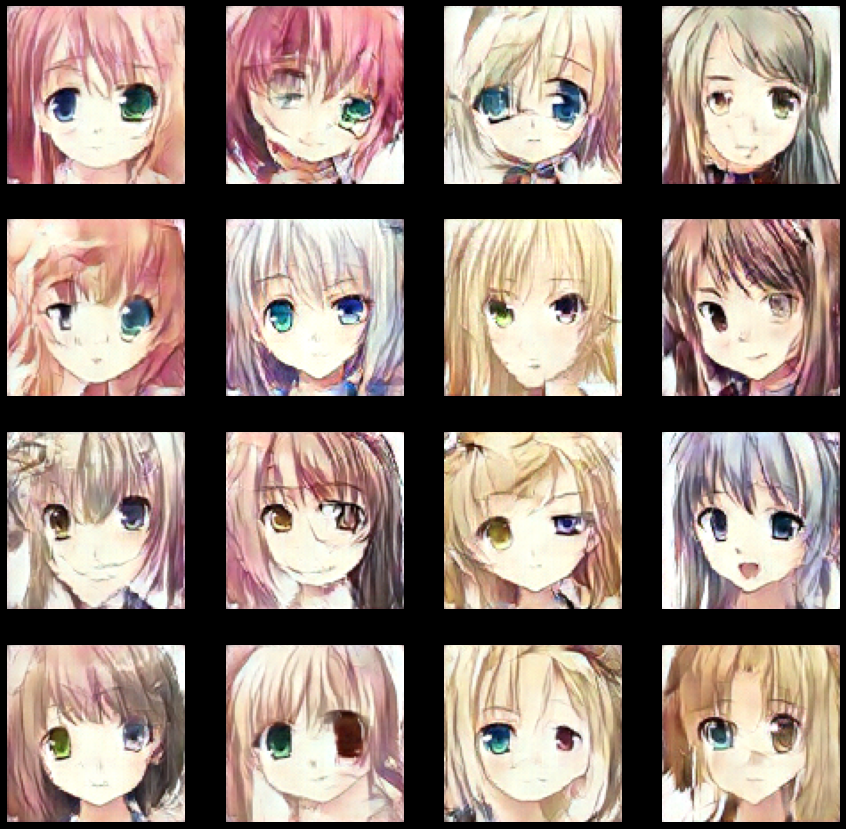

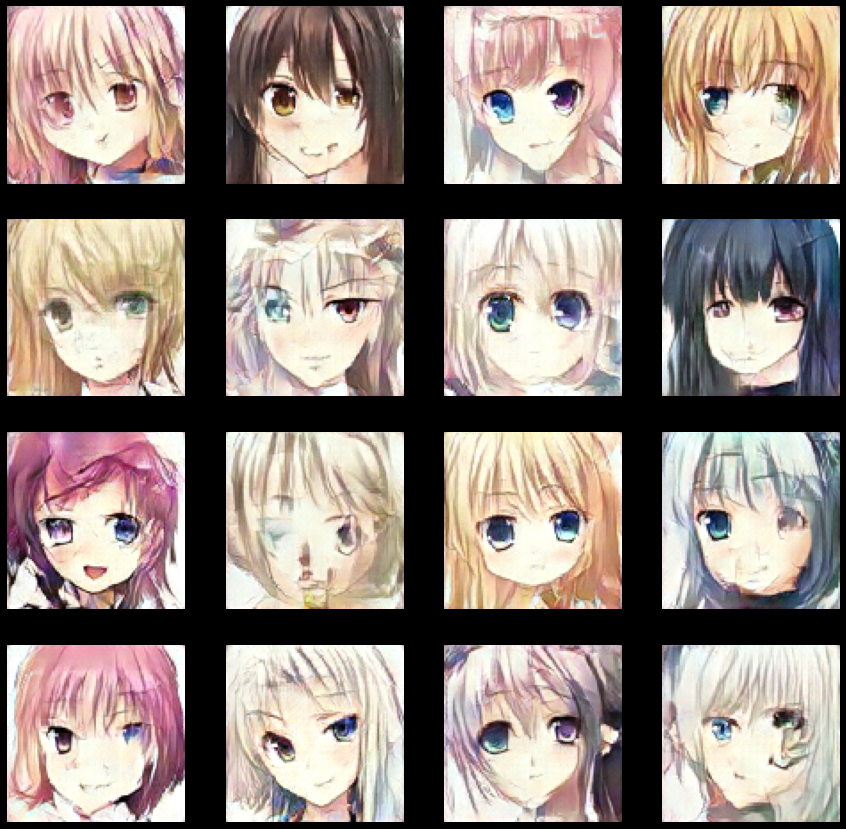

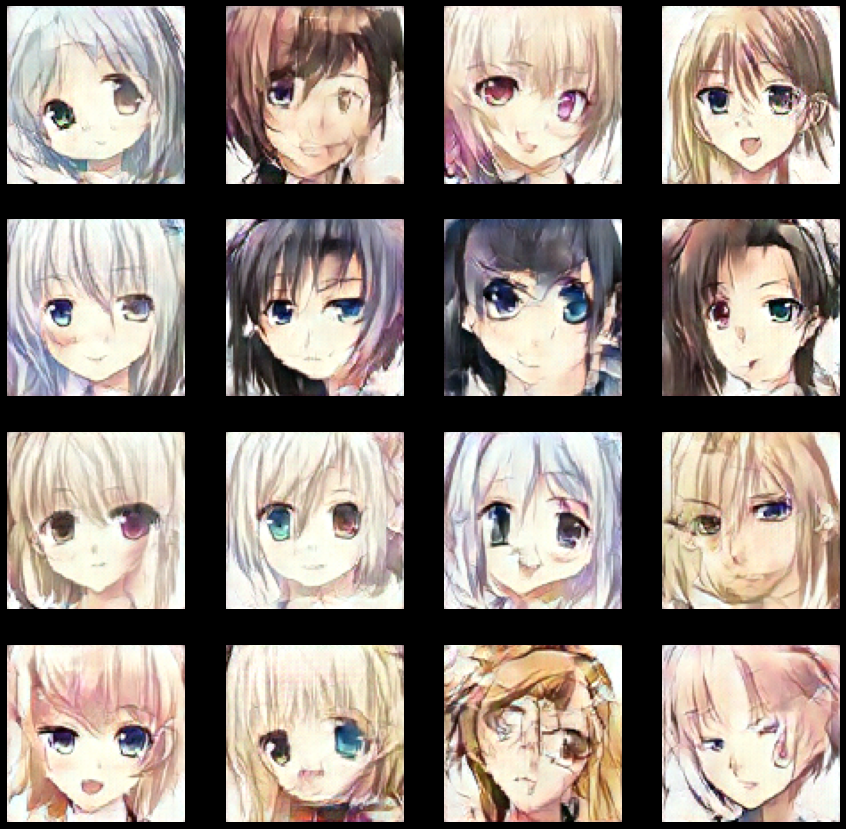

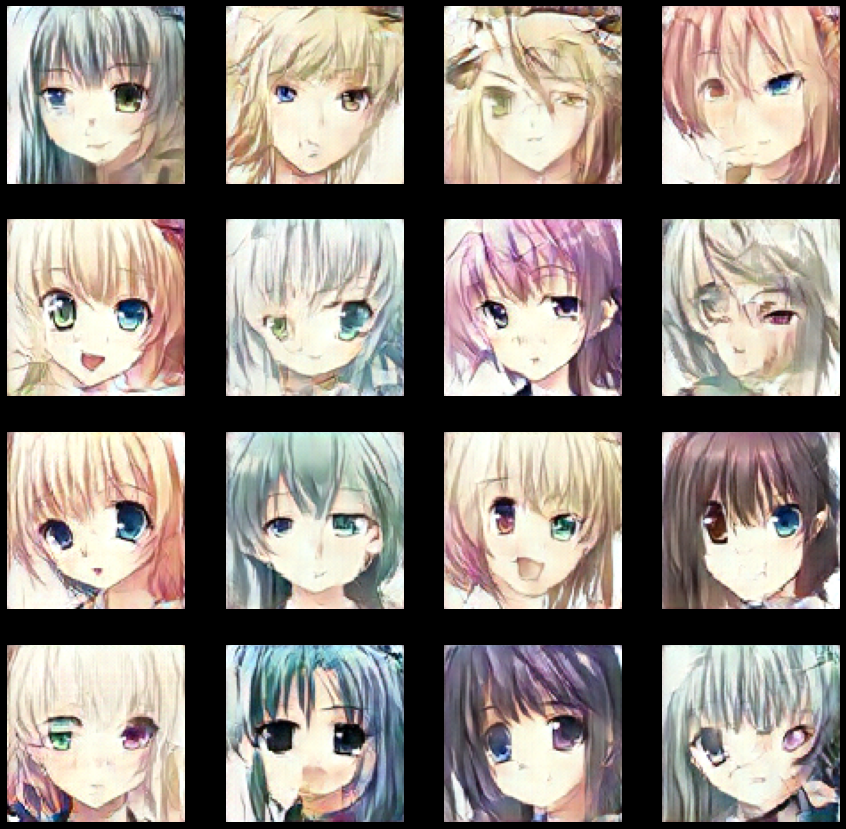

In [15]:
num_samples = 5
grid_size = 4

for i in range(num_samples):
  generate_and_save_images(model.generator, i, 
                          tf.random.normal([grid_size ** 2, noise_dim]), 
                          grid_side=grid_size, 
                          folder='samples', 
                          save_img=True)